In [134]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import itertools
import seaborn as sns
%matplotlib inline
import plotly.express as px
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller, acf, pacf,arma_order_select_ic
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_model import ARIMA
import warnings
warnings.simplefilter('ignore')
#     result.plot_predict(start=len(ts), end=len(ts)+len(test))
#     pred=result.forecast(steps=80)[0]
  
#     #Plotting results
#     f,ax=plt.subplots()
#     plt.plot(pred,c='green', label= 'predictions')
#     plt.plot(test, c='red',label='real values')
#     plt.legend()
#     plt.title('True vs predicted values')
#     #Printing the error metrics
#     print(result.summary())        
    
#     print('\nMean absolute percentage error: %f'%mape(test,pred[:len(test)]))
#     return (pred)

In [109]:
df=pd.read_csv('output.csv')

In [135]:
len(set(df['District']))


487

In [111]:
list = ['Date', 'State', 'District', 'Confirmed']
df2 = pd.read_csv('andhrasample1.csv', usecols=list)


In [112]:
df2=df2.loc[df2.District=='Anantapur',:]


In [113]:
df2

,Date,State,District,Confirmed
0,2020-04-26,Andhra Pradesh,Anantapur,53
1,2020-04-27,Andhra Pradesh,Anantapur,53
2,2020-04-28,Andhra Pradesh,Anantapur,54
3,2020-04-29,Andhra Pradesh,Anantapur,58
4,2020-04-30,Andhra Pradesh,Anantapur,61
...,...,...,...,...
158,2020-10-01,Andhra Pradesh,Anantapur,57708
159,2020-10-02,Andhra Pradesh,Anantapur,58041
160,2020-10-03,Andhra Pradesh,Anantapur,58323
161,2020-10-04,Andhra Pradesh,Anantapur,58734


In [114]:
df2.to_csv('andhrasample1.csv')

In [115]:
df2.tail()

,Date,State,District,Confirmed
158,2020-10-01,Andhra Pradesh,Anantapur,57708
159,2020-10-02,Andhra Pradesh,Anantapur,58041
160,2020-10-03,Andhra Pradesh,Anantapur,58323
161,2020-10-04,Andhra Pradesh,Anantapur,58734
162,2020-10-05,Andhra Pradesh,Anantapur,58734


In [116]:
# Convert date into Datetime
df2['Date']=pd.to_datetime(df2['Date'])

In [117]:
df2=df2.loc[:,['Date','Confirmed']]

In [118]:
df2.describe()

,Confirmed
count,163.000000
mean,17775.693252
std,20967.092897
min,53.000000
25%,264.500000
50%,3987.000000
75%,36584.000000
max,58734.000000


In [119]:
# Moving onto step2 : visualising the data

In [120]:
df2

,Date,Confirmed
0,2020-04-26,53
1,2020-04-27,53
2,2020-04-28,54
3,2020-04-29,58
4,2020-04-30,61
...,...,...
158,2020-10-01,57708
159,2020-10-02,58041
160,2020-10-03,58323
161,2020-10-04,58734


In [121]:
train=df2[:120]
test=df2[120:]

train = train.set_index(['Date'])
test = test.set_index(['Date'])
ts1=train
testFinl=test.copy()


In [122]:
def roll():
    ts=ts1
    ts.astype('int64')
    a=len(ts.loc[(ts['Confirmed']>=10)])
    ts=ts[-a:]
    return (ts.rolling(window=4,center=False).mean().dropna())


def rollPlot():
    ts=ts1
    ts.astype('int64')
    a=len(ts.loc[(ts['Confirmed']>=10)])
    ts=ts[-a:]
    plt.figure(figsize=(16,6))
    plt.plot(ts.rolling(window=7,center=False).mean().dropna(),label='Rolling Mean')
    plt.plot(ts['Confirmed'])
    plt.plot(ts.rolling(window=7,center=False).std(),label='Rolling std')
    plt.legend()
    plt.title('Cases distribution with rolling mean and standard' )
    plt.xticks([])

117

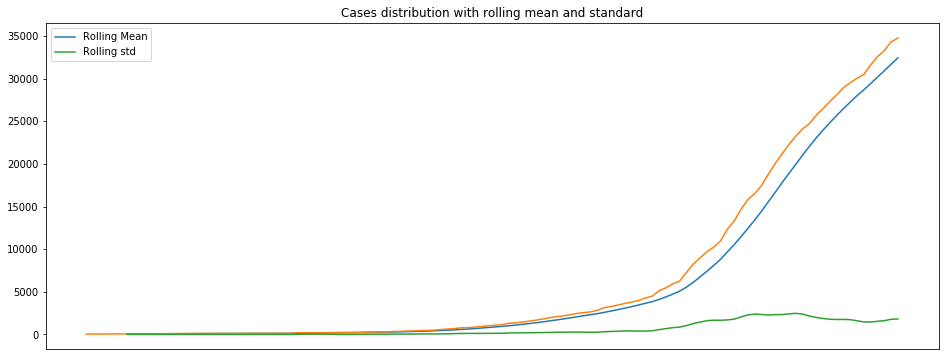

In [123]:
tsc1=roll()
rollPlot()
len(tsc1)

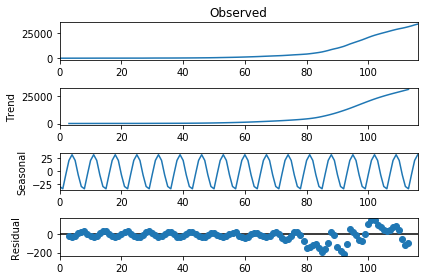

In [124]:
fig=sm.tsa.seasonal_decompose(tsc1.values,freq=7).plot()

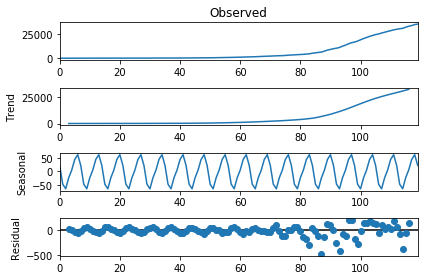

In [125]:
fig=sm.tsa.seasonal_decompose(train.values,freq=7).plot()

In [126]:
#Function to check the stationarity of the time serie using Dickey fuller test
def stationarity(ts):
    print('Results of Dickey-Fuller Test:')
    test = adfuller(ts, autolag='AIC')
    results = pd.Series(test[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for i,val in test[4].items():
        results['Critical Value (%s)'%i] = val
    print (results)


tsC=tsc1['Confirmed'].values
stationarity(tsC)
#test

Results of Dickey-Fuller Test:
Test Statistic                   0.340117
p-value                          0.979112
#Lags Used                      13.000000
Number of Observations Used    103.000000
Critical Value (1%)             -3.495493
Critical Value (5%)             -2.890037
Critical Value (10%)            -2.581971
dtype: float64


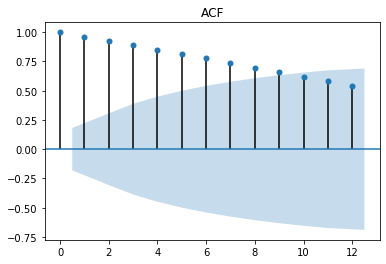

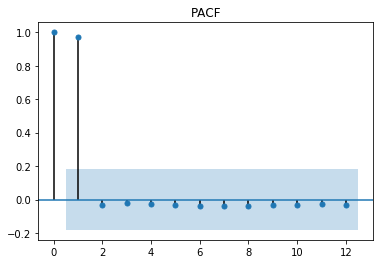

In [127]:
def corr(ts):
    plot_acf(ts,lags=12,title="ACF")
    plot_pacf(ts,lags=12,title="PACF")
    


corr(tsc1)

yo


,Confirmed
Date,
2020-08-24,35726
2020-08-25,36220
2020-08-26,36948
2020-08-27,37763
2020-08-28,38596
2020-08-29,39460
2020-08-30,40155
2020-08-31,41128
2020-09-01,41584


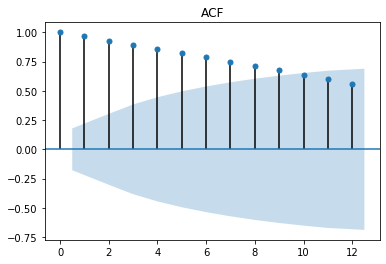

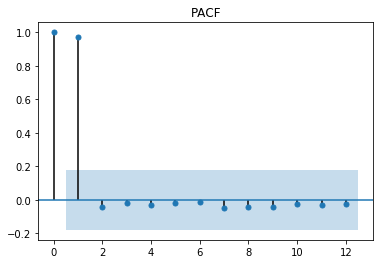

In [128]:
corr(train)
#type(train)
print("yo")
type(train)
test

In [145]:
def mape(y2, y_pred): 
    y2, y_pred = np.array(y2), np.array(y_pred)
    return np.mean(np.abs((y2 - y_pred) / y2)) * 100
#Arima modeling for ts
def split(ts):
    #splitting 85%/15% because of little amount of data
    size = int(len(ts) * 0.85)
    train= ts[:size]
    test = ts[size:]
    return(train,test)
def arima(ts,test):
    p=d=q=range(0,6)
    a=99999
    pdq=set(itertools.product(p,d,q))
    param=[1,1,1]
    #Determining the best parameters
    for var in pdq:
        try:
            model = ARIMA(ts, order=var)
            result = model.fit()

            if (result.aic<=a) :
                a=result.aic
                param=var
        except:
            continue
            
    #Modeling
    model = ARIMA(ts, order=param)
    result = model.fit()
#     joblib.dump(model,modelname)
    result.plot_predict(start=len(ts), end=len(ts)+len(test))
    pred=result.forecast(steps=80)[0]
  
    #Plotting results
    f,ax=plt.subplots()
    plt.plot(pred,c='green', label= 'predictions')
    plt.plot(test, c='red',label='real values')
    plt.legend()
    plt.title('True vs predicted values')
    #Printing the error metrics
    print(result.summary())        
    
    print('\nMean absolute percentage error: %f'%mape(test,pred[:len(test)]))
    return (pred)

                             ARIMA Model Results                              
Dep. Variable:                   D2.y   No. Observations:                  115
Model:                 ARIMA(5, 2, 5)   Log Likelihood                -572.752
Method:                       css-mle   S.D. of innovations             33.198
Date:                Sun, 08 Nov 2020   AIC                           1169.504
Time:                        15:20:41   BIC                           1202.443
Sample:                             2   HQIC                          1182.874
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          6.8639      6.346      1.082      0.279      -5.574      19.302
ar.L1.D2.y     0.7188      0.122      5.882      0.000       0.479       0.958
ar.L2.D2.y    -0.3083      0.159     -1.943      0.0

numpy.ndarray

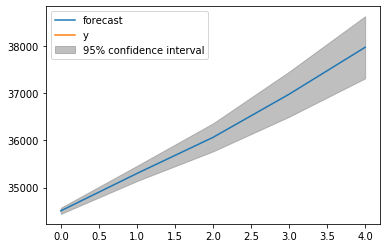

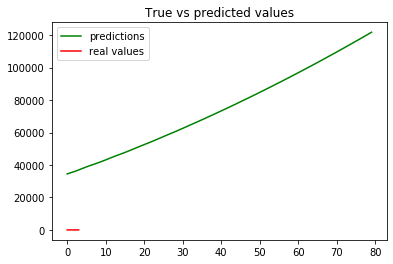

In [148]:
tsC=tsc1['Confirmed'].values
testtemp=test['Confirmed'].values
#traintemp,testtemp=split(tsC)
#test
pred=arima(tsC,testtemp)
#pred
# type(tsC)
# model=joblib.load('joblib_model')
# pred2=model.fit.forecast(steps=len(testtemp))[0]
type(pred)

In [147]:
pred

array([ 34505.84004974,  35297.97528166,  36063.55880613,  36978.44811985,
        37923.44842882,  38838.27070735,  39706.70621816,  40516.74247667,
        41340.17834301,  42219.79170867,  43156.22007792,  44118.15212201,
        45057.25574072,  45957.01177412,  46837.48377806,  47735.35688819,
        48676.20104219,  49654.27600864,  50641.55263289,  51611.63233909,
        52559.33905591,  53502.57051002,  54465.72287617,  55460.36029759,
        56477.94784685,  57498.64329889,  58507.8070541 ,  59506.5488378 ,
        60509.0305262 ,  61530.14650635,  62574.06397895,  63632.30278308,
        64691.68654236,  65744.94331334,  66795.56484971,  67853.88172932,
        68928.38090887,  70019.44651577,  71120.01475637,  72221.83538857,
        73321.90532628,  74424.14573078,  75535.59988129,  76660.69382381,
        77798.16572648,  78942.69436751,  80089.43423205,  81237.65687589,
        82390.82483601,  83553.45925704,  84727.5664469 ,  85911.40144569,
        87101.23845636,  

In [44]:
#COLLECTIVE

def rollCollective(district,case='Confirmed'):
    ts=df.loc[(df['District']==district)]  
    ts=ts[['Date',case]]
    ts=ts.set_index('Date')
    ts.astype('int64')
    a=len(ts.loc[(ts['Confirmed']>=10)])
    ts=ts[-a:]
    return (ts.rolling(window=4,center=False).mean().dropna())


def rollPlotCollective(district, case='Confirmed'):
    ts=df.loc[(df['District']==district)]  
    ts=ts[['Date',case]]
    ts=ts.set_index('Date')
    ts.astype('int64')
    a=len(ts.loc[(ts['Confirmed']>=10)])
    ts=ts[-a:]
    plt.figure(figsize=(16,6))
    plt.plot(ts.rolling(window=7,center=False).mean().dropna(),label='Rolling Mean')
    plt.plot(ts[case])
    plt.plot(ts.rolling(window=7,center=False).std(),label='Rolling std')
    plt.legend()
    plt.title('Cases distribution in %s with rolling mean and standard' %district)
    plt.xticks([])

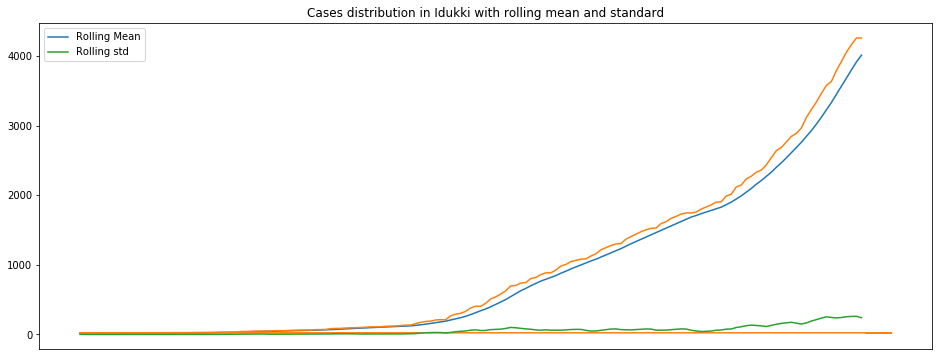

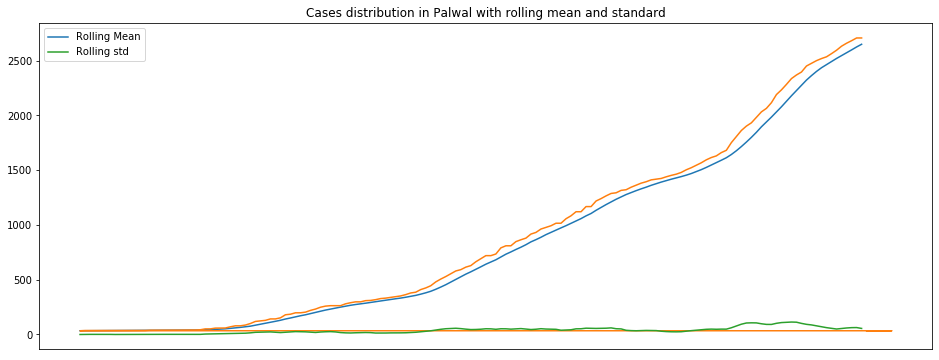

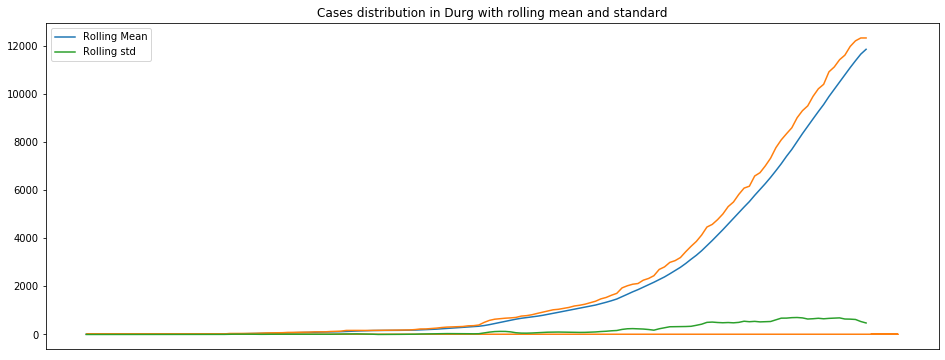

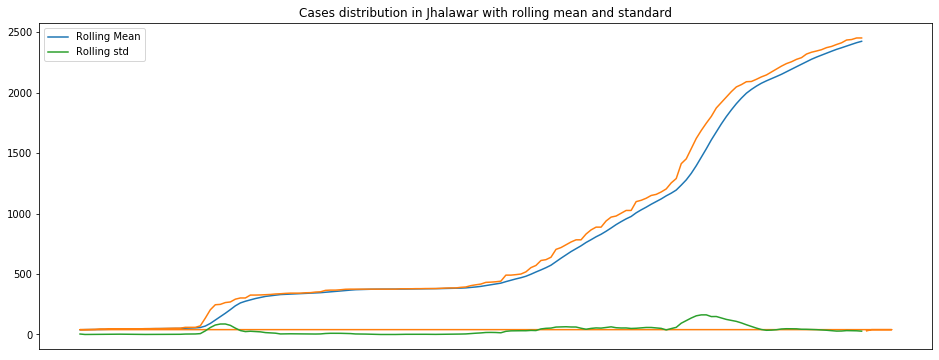

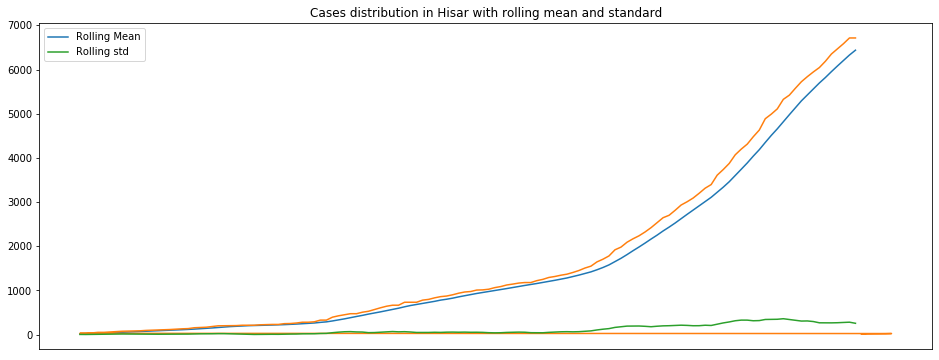

...

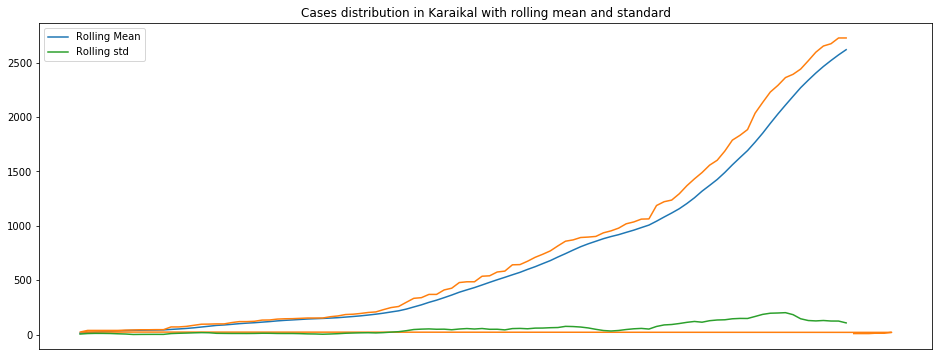

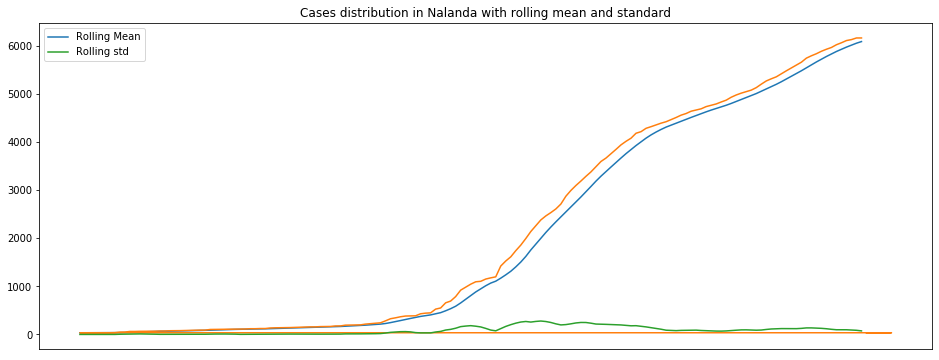

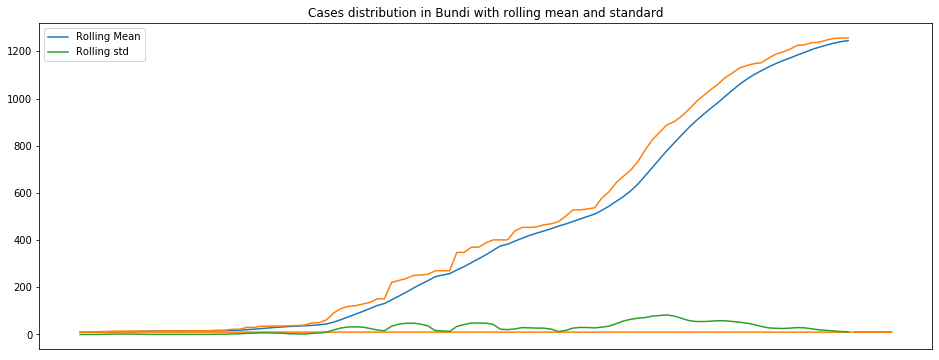

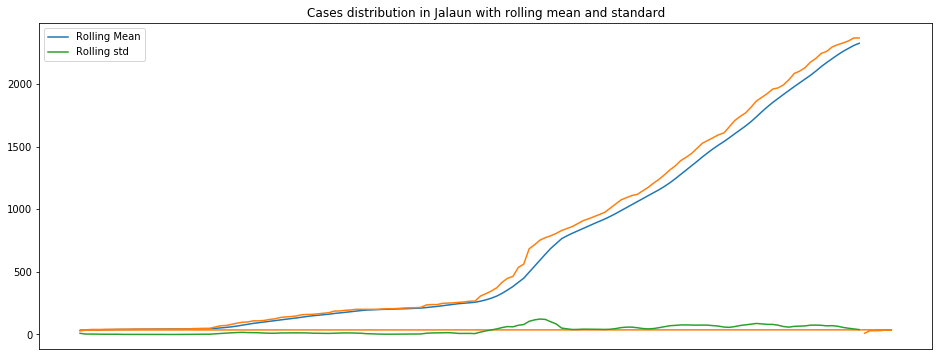

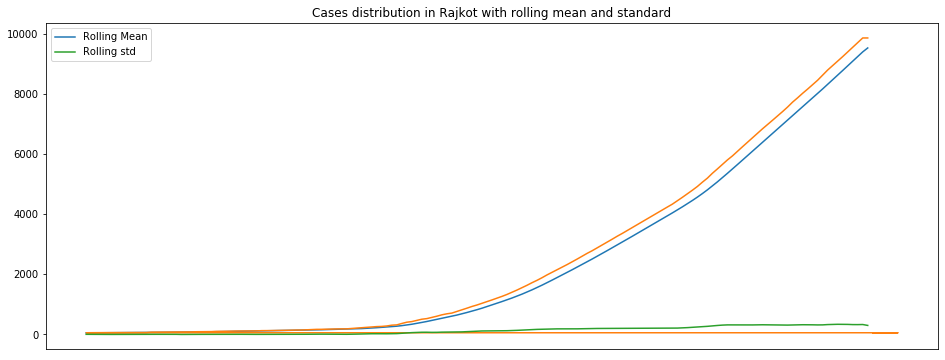

In [47]:
for distri in districts:
    rollPlotCollective(distri)

In [ ]:
a